In [3]:
import random

import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

In [301]:
### parent class for all cell types
class Cell:
    def __init__(
        self,
        kind,
        origin,
    ):
        '''
        Initialization of immune system state manager.

        Parameters
        ----------
        origin: string, optional
            Origin of cell. Options: 'host', 'donor', 'cancer'
        '''
        
        self.origin = origin
        self.kind = kind
        self.alive = True
        
    def cell_death(self):
        self.alive = False

### class describing cytotoxic CD8+ T cells
class TCell(Cell):
    def __init__(
        self,
        origin,
        p_kill_baseline,
        kind='tcell'
    ):
        '''
        Initialization of CD8+ T cells.

        Parameters
        ----------
        p_kill_baseline: float
            Probability that CD8+ T cell will kill a foreign cell at 0% MHC overlap
        '''
        
        super().__init__(kind, origin)
        self.p_kill_baseline = p_kill_baseline
        
    def interact(self, other_cell, mhc_overlap_perc, **kwargs):
        if other_cell.origin == self.origin:
            cur_overlap = 1  # cells from the same source don't kill each other
        elif self.origin == 'host' and other_cell.origin == 'cancer':
            cur_overlap = 0.95  # 5% mutated 
        elif self.origin == 'donor' and other_cell.origin == 'cancer':
            cur_overlap = 0.95 * mhc_overlap_perc
        else:  # donor and host relationship
            cur_overlap = mhc_overlap_perc
        
        if random.random() < self.p_kill_baseline * (1 - cur_overlap):
            other_cell.cell_death()  # destroy other cell
        
### class describing myeloid cells (donor-normal/host-cancer)
class MyeloidCell(Cell):
    def __init__(
        self,
        origin,
        rel_aml_potency,
        kind='myeloid'
    ):
        '''
        Initialization of myeloid cells.

        Parameters
        ----------
        rel_aml_potency: float
            How much more resource-demanding AML are relative to normal myeloid cells
            
        '''
        
        super().__init__(kind, origin)
        self.rel_aml_potency = rel_aml_potency
    
    def interact(self, other_cell, mhc_overlap_perc, **kwargs):
        pass  # no interaction and no induced death
            
### class describing myeloid cells (host-normal/donor-normal/host-cancer)
class NormalCell(Cell):
    def __init__(
        self,
        p_cell_death,
        origin='host',
        kind='normal'
    ):
        '''
        Initialization of CD8+ T cells.

        Parameters
        ----------
        p_cell_death: float
            Probability of cell death when cell death threshold is reached
        '''
        
        super().__init__(kind, origin)
        self.p_cell_death = p_cell_death
    
    def interact(self, other_cell, mhc_overlap_perc, thres_cell_death_reached=False):
        # check cell death
        if thres_cell_death_reached and random.random() < self.p_cell_death:
            self.cell_death()

In [408]:
### system-wide parameters and interaction management in a small-scale immune system
class ImmuneSystem:
    def __init__(
        self,
        mhc_overlap_perc=0.5,
        t_deplete_perc=0.0,
        p_kill_baseline=0.95,
        
        cap_cell_norm=100,
        cell_aml_count=10,
        cell_myeloid_count=10,
        cap_myeloid=30,
        rel_aml_potency=1.3,
        
        cap_t=10,
        cell_t_count_host=5,
        ratio_t_myeloid=1/3,
        
        thres_relapse=0.2,
        thres_cell_death=0.1,
        p_cell_death=0.35,
    ):
        '''
        Initialization of local immune system state manager.
        
        Parameters
        ----------
        mhc_overlap_perc: float, optional
            Percentage of MHC coding sequence overlap between host and donor cells
        t_deplete_perc: float, optional
            Level of T cell depletion from HSCT
        p_kill_baseline: float
            Probability that CD8+ T cell will kill a foreign cell at 0% MHC overlap
        
        cap_cell_norm: int, optional
            Non-blood local cell count (and maximum boundary)
        cell_aml_count: int, optional
            Initial AML cell count in the host
        cap_myeloid: int, optional
            Maximal count of myeloid cells production
        cell_myeloid_count: int, optional
            Transplant myeloid cell count
        rel_aml_potency: float, optional
            How much more resource-demanding AML are relative to normal myeloid cells

        cap_t: int, optional
            How many total T cells there can be
        cell_t_count_host: int, optional
            How many host T cells are there
        ratio_t_myeloid: float, optional
            Ratio of T cell count to myeloid cell count in an HSCT
            
        thres_relapse: float, optional
            Highest non-relapse proportion of leukemic to total myeloid cells
        thres_cell_death: float, optional
            Lowest survival proportion of healthy to total myeloid cells    
        p_cell_death: float, optional
            Probability of cell death when cell death threshold is reached
        '''
        
        # toggles
        self.mhc_overlap_perc = mhc_overlap_perc
        self.t_deplete_perc = t_deplete_perc
        self.p_kill_baseline = p_kill_baseline
        
        # cell counts
        self.cap_cell_norm = cap_cell_norm
        self.cell_norm_count = cap_cell_norm
        self.cell_aml_count = cell_aml_count
        self.cell_myeloid_count = cap_myeloid - cell_aml_count
        self.cap_myeloid = cap_myeloid
        self.rel_aml_potency = rel_aml_potency
        
        # t cells
        self.cap_t = cap_t
        self.cell_t_count_donor = min(cap_t, int(ratio_t_myeloid * self.cell_myeloid_count))
        self.cell_t_count_host = min(cell_t_count_host, cap_t - self.cell_t_count_donor)
        
        # system boundary conditions
        self.thres_relapse = thres_relapse
        self.thres_cell_death = thres_cell_death
        self.p_cell_death = p_cell_death
        
        self.initialize_network()
        
    def initialize_network(self):
        '''
        Initialize cell objects in a fully-connected graph
        '''

        cell_counts = [
            {'count': self.cell_norm_count, 'cell_type': 'normal', 'origin': 'host'},
            {'count': self.cell_aml_count, 'cell_type': 'myeloid', 'origin': 'cancer'},
            {'count': self.cell_myeloid_count, 'cell_type': 'myeloid', 'origin': 'donor'},
            {'count': self.cell_t_count_host, 'cell_type': 'tcell', 'origin': 'host'},
            {'count': self.cell_t_count_donor, 'cell_type': 'tcell', 'origin': 'donor'},
        ]
        
        # total cell count for the limited resources of the body
        self.total_cell_count = sum(cell['count'] for cell in cell_counts)
            
        self.network = nx.watts_strogatz_graph(self.total_cell_count, 26, 0.1)
        self.layout = nx.spring_layout(network)
            
        # color and shape coding:
        self.cell_shape = {
            'normal': 's',  # square
            'myeloid': 'o',
            'tcell': 'v',
        }
        self.cell_color = {
            'host': 'blue',
            'donor': 'green',
            'cancer': 'red',
        }
        
        cur_cell_id = 0  # to traverse the `cell_counts` list
        cell_counter = 0  # to keep track that we are filling the correct cells
        
        # mix cells to avoid homogeneous clusters
        nodes_ids = list(self.network.nodes)
        np.random.shuffle(nodes_ids)
        for node in nodes_ids:
            if cell_counter >= cell_counts[cur_cell_id]['count']:
                cur_cell_id += 1  # next cell type
                cell_counter = 0  # reset counting
            
            cell_type = cell_counts[cur_cell_id]['cell_type']
            origin = cell_counts[cur_cell_id]['origin'] 
            
            if cell_type == 'normal':
                initialized_cell = NormalCell(origin=origin, p_cell_death=self.p_cell_death)
            elif cell_type == 'myeloid':
                initialized_cell = MyeloidCell(origin=origin, rel_aml_potency=self.rel_aml_potency)
            elif cell_type == 'tcell':
                initialized_cell = TCell(origin=origin, p_kill_baseline=self.p_kill_baseline)
            
            self.network.nodes[node]['cell'] = initialized_cell
            self.network.nodes[node]['color'] = self.cell_color[origin]
            self.network.nodes[node]['shape'] = self.cell_shape[cell_type]
            
            cell_counter += 1
            
        self.dead_cells = []  # storage for indices of "vacant slots"
        self.step = 0  # track number of simulation steps
        
    def replenish_vacant_cell(self):
        '''
        Probabilistically fill out a place for cells that have died
        '''
        
        if len(self.dead_cells) == 0:
            return  # no empty slots
        
        # regeneration proportional to distance to max capacity
        cell_choices =\
            ['normal'] * (self.cap_cell_norm - self.cell_norm_count) +\
            ['myeloid'] * (self.cap_myeloid - self.cell_aml_count - self.cell_myeloid_count) +\
            ['tcell'] * (self.cap_t - self.cell_t_count_donor - self.cell_t_count_host)
            
        if len(cell_choices) > 0:  # in case our system is full
            cell_type = np.random.choice(cell_choices)
            node = self.dead_cells.pop(0)  # FIFO
            
            if cell_type == 'normal':
                origin = 'host'
                initialized_cell = NormalCell(origin=origin, p_cell_death=self.p_cell_death)
            elif cell_type == 'myeloid':
                # choose myeloid origin with bias
                denom = 1 + self.rel_aml_potency
                origin = np.random.choice(['donor', 'cancer'], p=[1 / denom, (denom - 1) / denom])
                initialized_cell = MyeloidCell(origin=origin, rel_aml_potency=self.rel_aml_potency)
            elif cell_type == 'tcell':
                origin = np.random.choice(['host', 'donor'])
                initialized_cell = TCell(origin=origin, p_kill_baseline=self.p_kill_baseline)
            
            self.network.nodes[node]['cell'] = initialized_cell
            self.network.nodes[node]['color'] = self.cell_color[origin]
            self.network.nodes[node]['shape'] = self.cell_shape[cell_type]
            
        
    def update(self):
        self.replenish_vacant_cell()
        
        # get all t cells
        t_cell_idx = []
        for node in self.network.nodes:
            if self.network.nodes[node]['cell'] != None and self.network.nodes[node]['cell'].kind == 'tcell':
                t_cell_idx.append(node)
        
        # "speaker" selection
        t_node = np.random.choice(t_cell_idx)
        # "listener" selection
        other_node = np.random.choice(list(self.network.neighbors(t_node)))
        while self.network.nodes[other_node]['cell'] == None:  # re-select if empty
            other_node = np.random.choice(list(self.network.neighbors(t_node)))
            
        self.network.nodes[t_node]['cell'].interact(self.network.nodes[other_node]['cell'], mhc_overlap_perc=self.mhc_overlap_perc)
            
        # update status of "listener" cell
        if self.network.nodes[other_node]['cell'].alive == False:
            self.mark_dead(other_node)
            
        self.recalculate_population()
        self.step += 1
    
    def mark_dead(self, node_id):
        self.network.nodes[node_id]['cell'] = None
        self.network.nodes[node_id]['color'] = 'black'
        self.network.nodes[node_id]['shape'] = 'x'  # cross
        self.dead_cells.append(node_id)
        
    def recalculate_population(self):
        cells = []
        for i in self.network.nodes:
            if self.network.nodes[i]['cell'] != None:
                cells.append((
                    self.network.nodes[i]['cell'].kind,
                    self.network.nodes[i]['cell'].origin
                ))
     
        self.cell_norm_count = cells.count(('normal', 'host'))  # normal cells
        self.cell_myeloid_count = cells.count(('myeloid', 'donor'))  # donor myeloid
        self.cell_aml_count = cells.count(('myeloid', 'cancer'))  # cancer myeloid
        self.cell_t_count_host = cells.count(('tcell', 'host'))  # host t cells
        self.cell_t_count_donor = cells.count(('tcell', 'donor'))  # donor t cells
    
    def observe(self):
        plt.figure(figsize=(16, 6), dpi=330)
        plt.subplot('121')
        self.plot_network()
        plt.subplot('122')
        self.plot_stats()
        plt.show()
        
    def plot_network(self):
        '''
        Visualize network structure at current timestep
        '''
        
        colors = [self.network.nodes[i]['color'] for i in self.network.nodes]
        shapes = [self.network.nodes[i]['shape'] for i in self.network.nodes]
            
        self.layout = nx.spring_layout(self.network, pos=self.layout)
        node_pos = self.layout
        
        for shape, color in zip(shapes, colors):
            nx.draw_networkx_nodes(
                self.network,
                node_pos,
                node_color=color,
                node_shape=shape,
                # if node is the shape and color of the current configuration
                nodelist=[
                    node for node in filter(lambda x: (self.network.nodes[x]['shape'] == shape) & (self.network.nodes[x]['color'] == color), self.network.nodes)
                ],
                node_size=50,
            )

        nx.draw_networkx_edges(network, alpha=(5/self.total_cell_count), pos=node_pos)
    
    def plot_stats(self):
        '''
        Bar chart of cell counts in the system
        '''
        
        bar_titles = ['normal', 'donor myeloid', 'aml', 'host t', 'donor t']
        colors = ['blue', 'green', 'red',  'blue', 'green']
        # percentage of total capacity for cell types
        cell_type_saturation = [
            self.cell_norm_count, # / self.cap_cell_norm,  # normal cell
            self.cell_myeloid_count, # / self.cap_myeloid,  # donor myeloid
            self.cell_aml_count, # / self.cap_myeloid,  # cancer myeloid
            self.cell_t_count_host, # / self.cap_t,  # host t cells
            self.cell_t_count_donor, # / self.cap_t,  # donor t cells
        ]
        
        plt.bar(bar_titles, cell_type_saturation, color=colors)
        

In [409]:
immune_system = ImmuneSystem(cap_cell_norm=100)

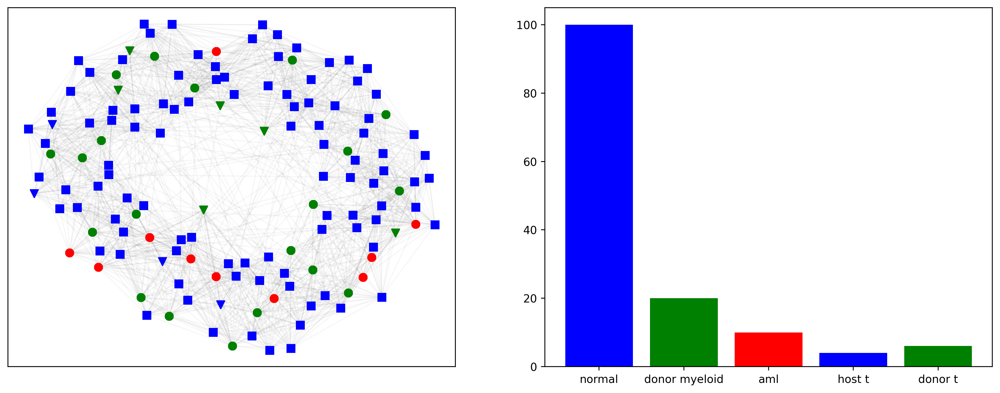

In [410]:
immune_system.observe()

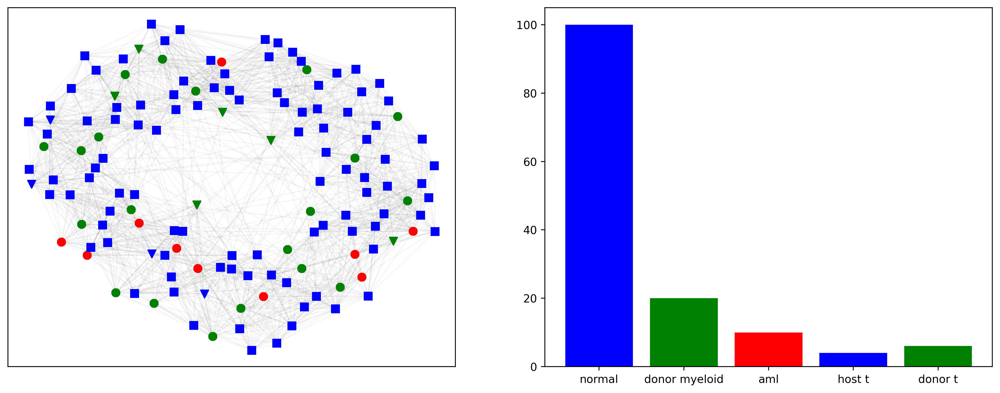

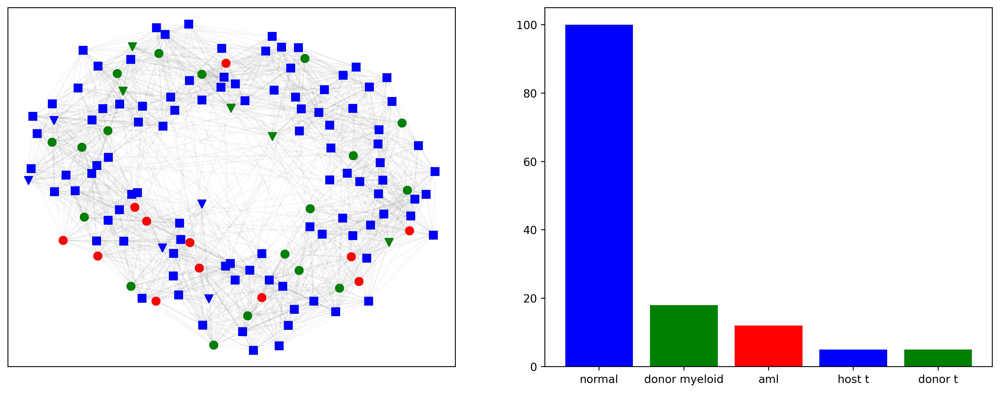

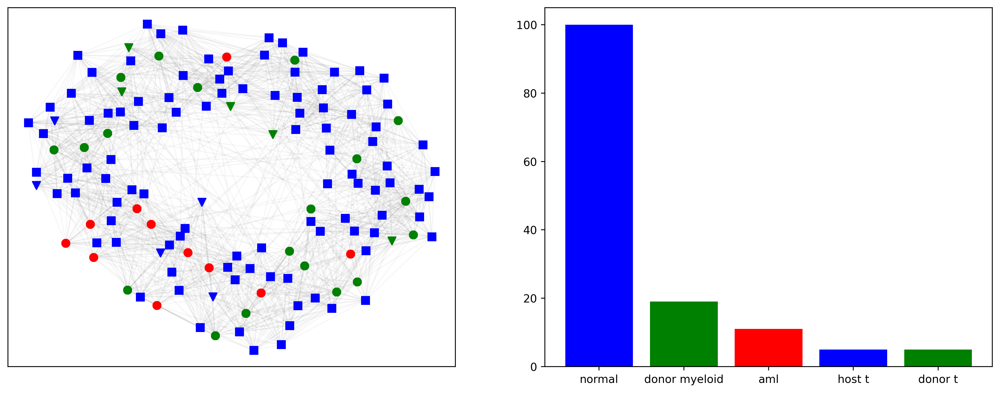

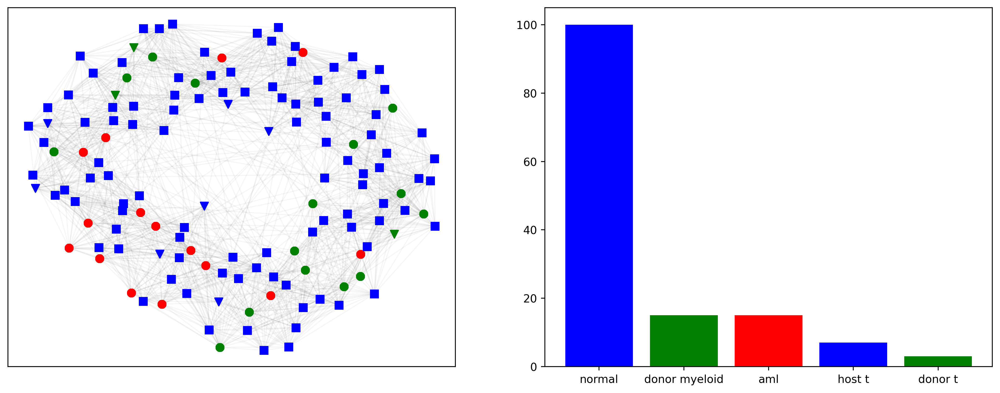

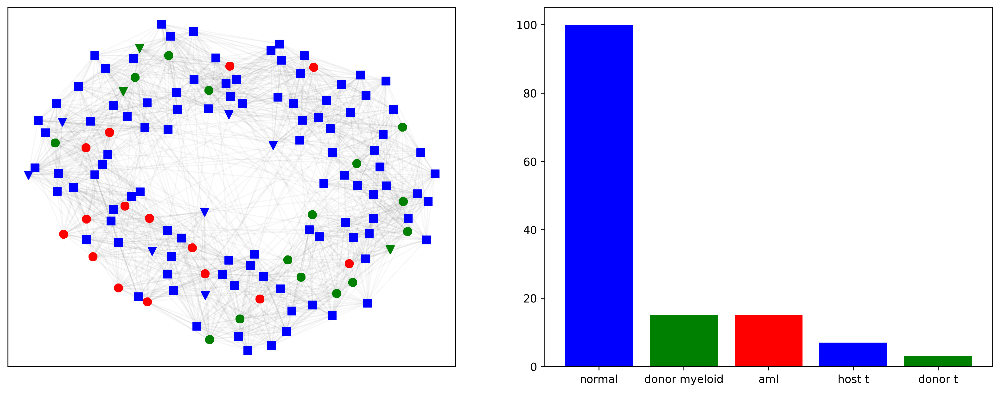

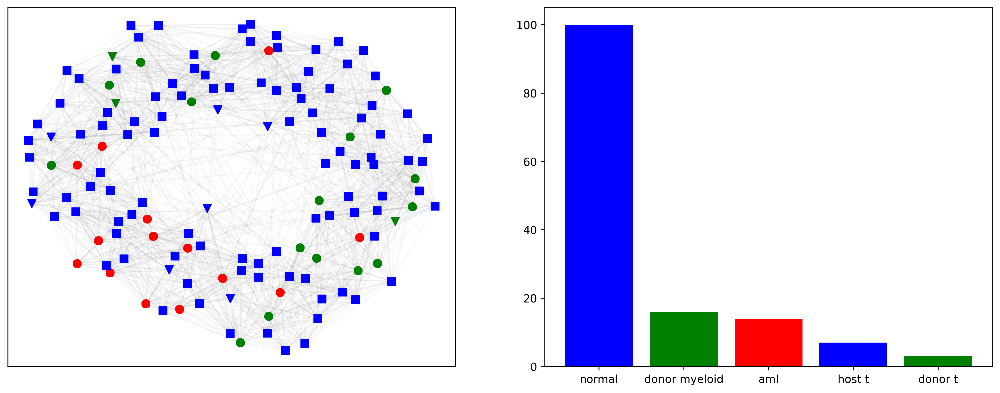

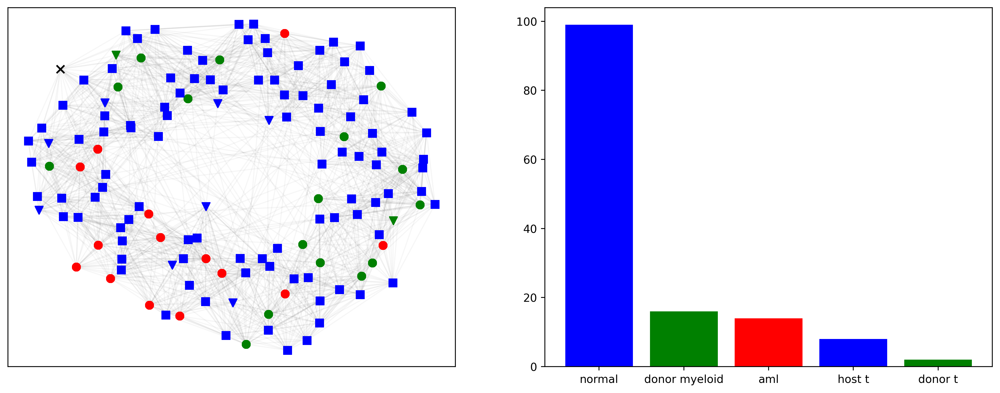

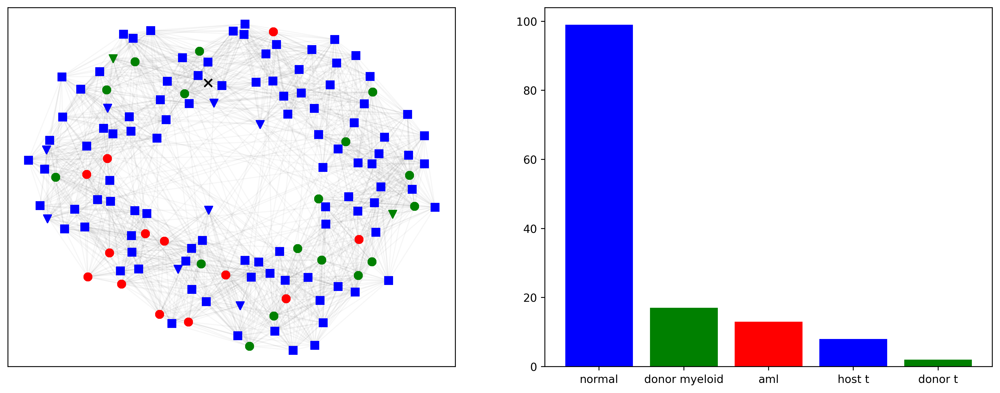

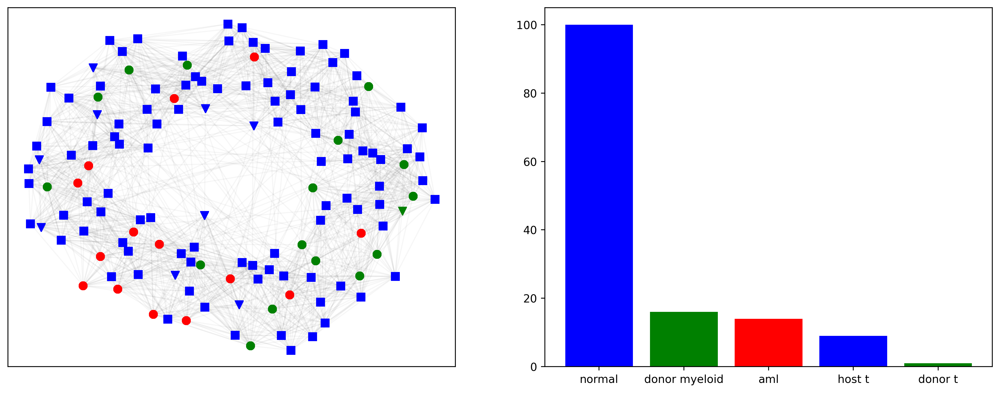

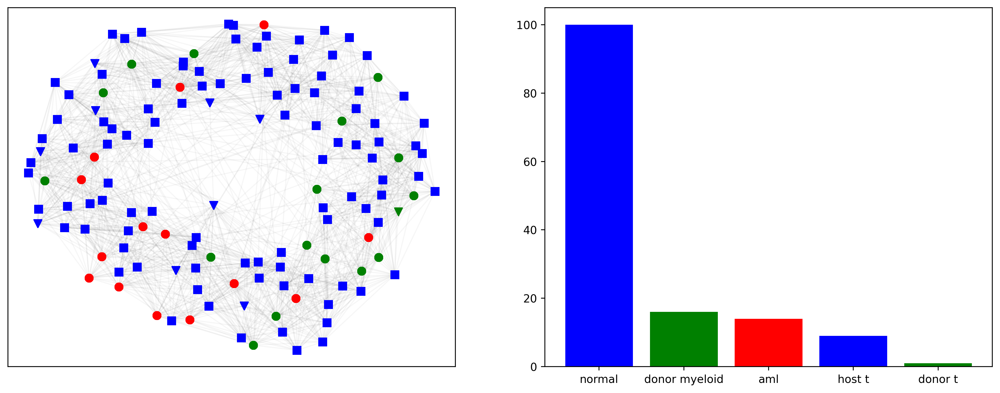

In [411]:
for i in range(1000):
    immune_system.update()
    if i % 100 == 0:
        immune_system.observe()

Text(0.5, 1.0, '2')

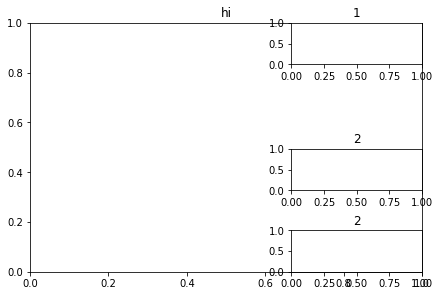

In [412]:
fig3 = plt.figure(constrained_layout=True)
gs = fig3.add_gridspec(6, 3)
f3_ax1 = fig3.add_subplot(gs[:6, :6])
f3_ax1.set_title('hi')
f3_ax2 = fig3.add_subplot(gs[0, 2])
f3_ax2.set_title('1')
f3_ax2 = fig3.add_subplot(gs[1, 2])
f3_ax2.set_title('2')
f3_ax2 = fig3.add_subplot(gs[2, 2])
f3_ax2.set_title('2')

ValueError: 'c' argument has 1000 elements, which is inconsistent with 'x' and 'y' with size 140.

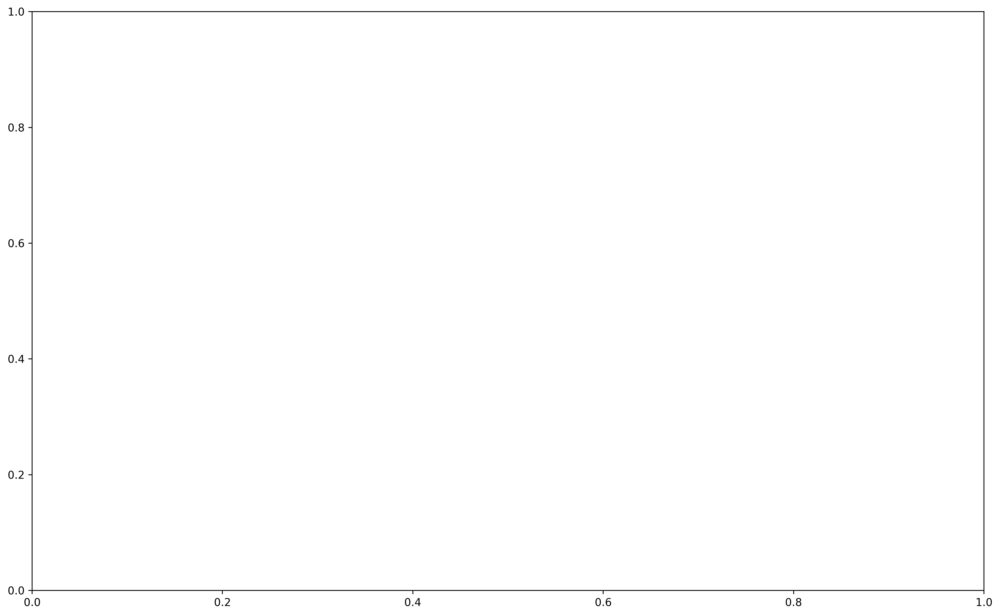

In [62]:
network.nodes[1]

{}

In [185]:
a = [1, 2, 5, 6]

In [186]:
b = a.pop(0)

In [188]:
a

[2, 5, 6]

In [15]:
a = {'a':1, 'b':5, 'c':5}

In [20]:
for c in a.keys():
    print(c)

a
b
c
